In [4]:
# Install dependency
!pip install split-folders kagglehub numpy matplotlib pillow scikit-learn tensorflow

In [21]:
import os
import math
import shutil
import json
import splitfolders
import kagglehub
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics import precision_score, recall_score, f1_score, average_precision_score

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [7]:
# Download dataset dari Kaggle
path = kagglehub.dataset_download("darmawansuhara/kesegaran-buah")

# Buat folder tujuan
target_dir = "/content/dataset_buah"
os.makedirs(target_dir, exist_ok=True)

# Ambil semua isi folder dataset_buah dari hasil download dan pindahkan
source_dir = os.path.join(path, "dataset_buah")

# Copy contents instead of moving and deleting
for item in os.listdir(source_dir):
    s = os.path.join(source_dir, item)
    d = os.path.join(target_dir, item)
    if os.path.isdir(s):
        shutil.copytree(s, d, dirs_exist_ok=True)
    else:
        shutil.copy2(s, d)

print("Dataset siap di:", target_dir)

100%|██████████| 67.2M/67.2M [00:04<00:00, 17.0MB/s]

Extracting files...


Dataset siap di: /content/dataset_buah


In [8]:
# ===== Hapus file corrupt sebelum split =====
dataset_dir = "/content/dataset_buah"

def remove_corrupt_images(folder):
    removed = []
    for root, _, files in os.walk(folder):
        for f in files:
            path = os.path.join(root, f)
            try:
                img = Image.open(path)
                img.verify()
            except:
                removed.append(path)
                os.remove(path)
    return removed

removed_files = remove_corrupt_images(dataset_dir)
print(f"🗑 File corrupt dihapus: {len(removed_files)}")

🗑 File corrupt dihapus: 93


In [9]:
# ===== Split Dataset =====
DATASET_PATH = "/content/dataset_buah"
output_path = "/content/datab_split"

splitfolders.ratio(dataset_dir, output=output_path, seed=42, ratio=(0.8, 0.2))
print("✅ Dataset berhasil dibagi menjadi train/val/test di:", output_path)

Copying files: 644 files [00:00, 5663.31 files/s]

✅ Dataset berhasil dibagi menjadi train/val/test di: /content/datab_split


In [10]:
# ===== Data Generator =====
IMG_SIZE = (224, 224)
BATCH_SIZE = 8

train_datagen = ImageDataGenerator(
                                  rescale=1./255,
                                  rotation_range=15,
                                  width_shift_range=0.1,
                                  height_shift_range=0.1,
                                  shear_range=0.05,
                                  zoom_range=0.1,
                                  horizontal_flip=True,
                                  fill_mode='nearest'
)


val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    "/content/datab_split/train",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    "/content/datab_split/val",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

Found 510 images belonging to 15 classes.
Found 134 images belonging to 15 classes.


In [13]:
# ===== Model =====
# Load MobileNetV2 (pretrained on ImageNet) tanpa top layer
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

# Tambahkan custom layer di atasnya
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x) # Added L2 regularization
x = Dropout(0.5)(x) # Increased dropout rate
x = Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x) # Added L2 regularization
x = Dropout(0.4)(x) # Increased dropout rate
predictions = Dense(train_generator.num_classes, activation='softmax')(x)


model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
model.compile(optimizer=Adam(learning_rate=1e-3), # Reduced initial learning rate
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# Callback
early_stop = EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True, mode='max') # Increased patience
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=7, verbose=1) # Increased patience

In [28]:
total_weights = 0
total_biases = 0
sample_weights = []
sample_biases = []

for layer in model.layers:
    weights = layer.get_weights()
    if len(weights) > 0:
        total_weights += np.prod(weights[0].shape)
        sample_weights.extend(weights[0].flatten()[:3])
        if len(weights) > 1:
            total_biases += np.prod(weights[1].shape)
            sample_biases.extend(weights[1].flatten()[:3])

print(f"Total Bobot (Weights): {total_weights}")
print(f"Total Bias: {total_biases}")
print(f"Contoh Bobot: {sample_weights[:5]}")
print(f"Contoh Bias: {sample_biases[:5]}")

Total Bobot (Weights): 2569184
Total Bias: 17455
Contoh Bobot: [np.float32(-0.17165923), np.float32(-0.33373192), np.float32(0.053012226), np.float32(0.6121762), np.float32(1.5259982)]
Contoh Bias: [np.float32(2.2555487), np.float32(2.9224594), np.float32(-1.6631562), np.float32(1.7443249), np.float32(3.2285683)]


In [25]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,620,753 (10.00 MB)

 Trainable params: 362,767 (1.38 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 2 (12.00 B)

In [14]:
# ===== Training =====
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=50,  # max epoch
    callbacks=[early_stop, reduce_lr]
)

Epoch 1/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - accuracy: 0.1001 - loss: 3.7475

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


64/64 ━━━━━━━━━━━━━━━━━━━━ 30s 319ms/step - accuracy: 0.1004 - loss: 3.7427 - val_accuracy: 0.4478 - val_loss: 2.7335 - learning_rate: 0.0010
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - accuracy: 0.1894 - loss: 2.9561 - val_accuracy: 0.5299 - val_loss: 2.1760 - learning_rate: 0.0010
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - accuracy: 0.3646 - loss: 2.4198 - val_accuracy: 0.6045 - val_loss: 1.8673 - learning_rate: 0.0010
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - accuracy: 0.4197 - loss: 2.2864 - val_accuracy: 0.6418 - val_loss: 1.6232 - learning_rate: 0.0010
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - accuracy: 0.5148 - loss: 1.9948 - val_accuracy: 0.6418 - val_loss: 1.5606 - learning_rate: 0.0010
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 147ms/step - accuracy: 0.5693 - loss: 1.7584 - val_accuracy: 0.5970 - val_loss: 1.4950 - learning_rate: 0.0010
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - accuracy: 0.5880 - loss: 1.5818 - val_

In [15]:
# ===== Evaluate on Validation Set =====
loss, acc = model.evaluate(val_generator)
print(f"📊 Akurasi di validation set: {acc*100:.2f}%")

17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.7479 - loss: 1.1500
📊 Akurasi di validation set: 76.87%


In [16]:
# ===== Save Model & Labels =====
model.save("model_buah.h5")

print("✅ Model tersimpan")

✅ Model tersimpan


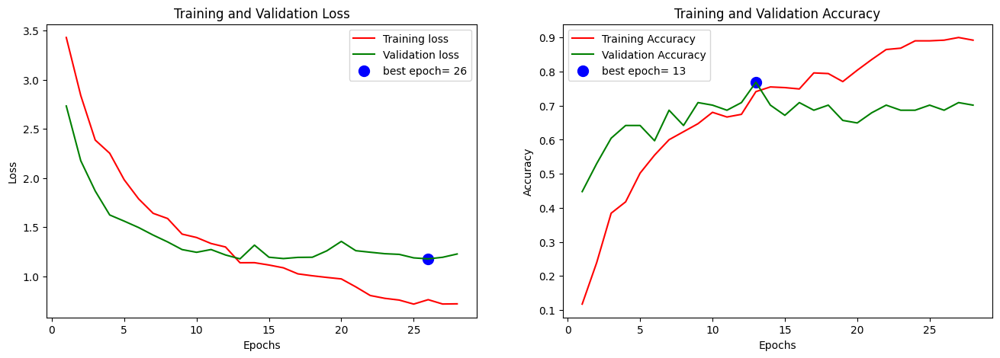

5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 823ms/step
Evaluation Metrics
Precision  : 0.7810
Recall     : 0.7718
F1 Score   : 0.7673
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.7506 - loss: 1.2374
Akurasi Validasi: 76.87%
Loss Validasi: 1.1761


In [17]:
# Ambil nilai dari history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

epochs = range(1, len(train_loss) + 1)

# Tentukan best epoch berdasarkan val_loss atau val_accuracy
best_epoch_loss = np.argmin(val_loss) + 1
best_epoch_acc = np.argmax(val_acc) + 1

# Plot Loss
plt.figure(figsize=(16, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.scatter(best_epoch_loss, val_loss[best_epoch_loss-1], c='blue', s=100, label=f'best epoch= {best_epoch_loss}')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'g', label='Validation Accuracy')
plt.scatter(best_epoch_acc, val_acc[best_epoch_acc-1], c='blue', s=100, label=f'best epoch= {best_epoch_acc}')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Ambil data validasi (sesuaikan variable datagennya)
val_images, val_labels = next(val_generator)
for i in range(len(val_generator) - 1):
    x, y = next(val_generator)
    val_images = np.vstack((val_images, x))
    val_labels = np.vstack((val_labels, y))

# Prediksi
y_pred_prob = model.predict(val_images)
y_pred = np.argmax(y_pred_prob, axis=1)
y_true = np.argmax(val_labels, axis=1)

# Hitung Precision, Recall, F1 (macro)
precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
f1 = f1_score(y_true, y_pred, average='macro')

print("Evaluation Metrics")
print(f"Precision  : {precision:.4f}")
print(f"Recall     : {recall:.4f}")
print(f"F1 Score   : {f1:.4f}")

# Evaluasi pada validation set
loss, acc = model.evaluate(val_generator, verbose=1)
print(f"Akurasi Validasi: {acc*100:.2f}%")
print(f"Loss Validasi: {loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


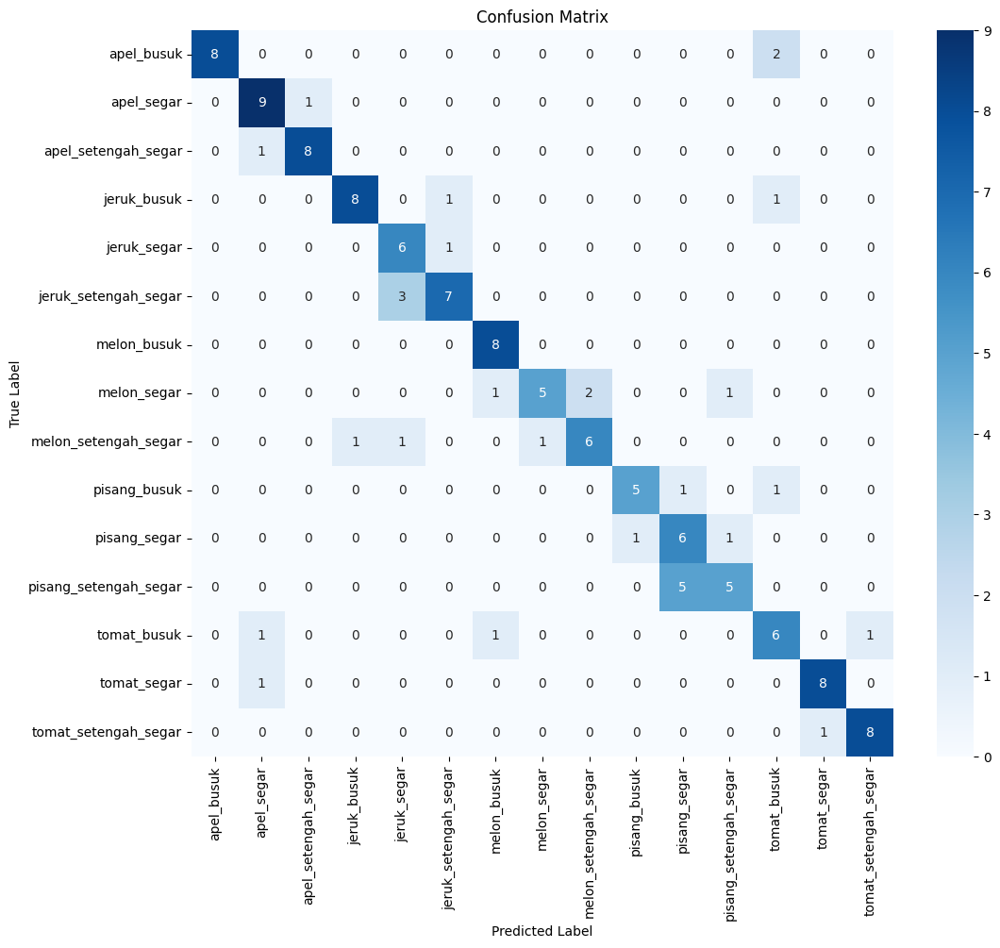

In [18]:
# ===== Confusion Matrix =====
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Get true labels and predictions for the validation set
y_true = np.argmax(val_labels, axis=1)
y_pred = model.predict(val_images)
y_pred_classes = np.argmax(y_pred, axis=1)

# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Get class names
class_names = list(val_generator.class_indices.keys())

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

Total Gambar: 134
Benar: 103
Akurasi: 76.87%


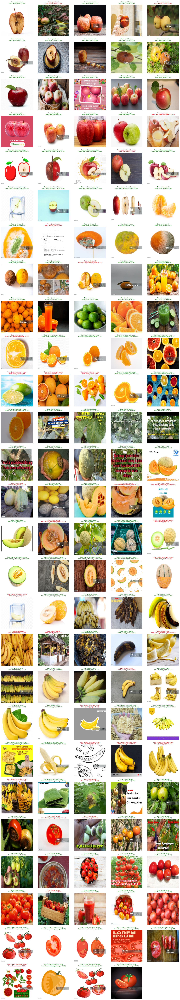

In [22]:
# Load model
model = load_model("model_buah.h5")

# Path ke dataset (misalnya untuk validasi)
dataset_dir = "/content/datab_split/val/"

# Ukuran input model
IMG_SIZE = (224,224)

# Ambil label kelas dari folder
class_labels = sorted(os.listdir(dataset_dir))

# Hitung total benar dan total gambar
total_images = 0
correct_predictions = 0

# Simpan hasil detail
results = []

for class_name in class_labels:
    class_path = os.path.join(dataset_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    for file_name in os.listdir(class_path):
        if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(class_path, file_name)

            # Load dan preprocess image
            img = image.load_img(img_path, target_size=IMG_SIZE)
            img_array = image.img_to_array(img)
            img_array = np.expand_dims(img_array, axis=0) / 255.0

            # Predict
            predictions = model.predict(img_array, verbose=0)
            predicted_index = np.argmax(predictions[0])
            predicted_label = class_labels[predicted_index]
            confidence = predictions[0][predicted_index]

            # Cek benar atau salah
            is_correct = (predicted_label == class_name)
            if is_correct:
                correct_predictions += 1

            total_images += 1
            results.append({
                "path": img_path,
                "true_label": class_name,
                "predicted_label": predicted_label,
                "confidence": confidence,
                "correct": is_correct
            })

# Hitung akurasi
accuracy = correct_predictions / total_images * 100
print(f"Total Gambar: {total_images}")
print(f"Benar: {correct_predictions}")
print(f"Akurasi: {accuracy:.2f}%")

# --- Visualisasi Hasil ---
cols = 5  # jumlah kolom
rows = math.ceil(len(results) / cols)
plt.figure(figsize=(15, rows * 3))

for i, r in enumerate(results):
    plt.subplot(rows, cols, i+1)
    img = image.load_img(r['path'], target_size=(100, 100))
    plt.imshow(img)
    plt.axis('off')
    title_color = "green" if r["correct"] else "red"
    plt.title(f"True: {r['true_label']}\nPred: {r['predicted_label']} ({r['confidence']:.2f})",
              fontsize=8, color=title_color)

plt.tight_layout()
plt.show()
